In [55]:
import pandas as pd
import seaborn as sns
import numpy as np
import random
from matplotlib import pyplot as plt

sns.set(style="ticks", context="talk")
color_palette = sns.color_palette("hls", 8)

### Reading all the DataFrames for depth 2 -> 10

In [56]:
frames = []
for depth in [2, 4, 8, 16]:
    frames.append(pd.read_pickle(f"./results_3/results_{depth}.pkl"))
df = pd.concat(frames)
frames = []

In [57]:
# # Sripath sheet
# percentile_filtered = df[df['k_percentile'].isin([0.95, 0.99, 1])]
# percentile_filtered.sort_values(by=['k_percentile', 'cm_depth', 'cm_width']).to_csv("accuracies.csv")

### Utility functions

In [86]:
def plot_for_depth(data, depth):
    plt.figure(figsize=(25, 10))
    ax = sns.lineplot(x="cm_width",
                      y="accuracy",
                      hue="k_percentile",
                      data=data[data['k_percentile'] == percentile],
                      palette=color_palette
                     )
    ax.set_title(f'CM Sketch Width vs Accuracy\nPercentile: {percentile}', fontsize=16);

def plot_for_percentile(data, percentile):
    plt.figure(figsize=(16, 9), dpi=600)
    ax = sns.lineplot(
        x="cm_width",
        y="accuracy",
        size="cm_depth",
        hue="cm_depth",
        data=data[data['k_percentile'] == percentile],
        legend="full",
        palette=color_palette
    );
    ax.set_title(f'CM Sketch Width vs Accuracy\nQuery Percentile: k={percentile}', fontsize=32);
    ax.set_title(f'Query Percentile: k={percentile}', fontsize=48);
    ax.set_ylabel("Accuracy", fontsize=48)
    ax.set_xlabel("CM Sketch Width", fontsize=48)
    ax.tick_params(axis='both', which='major', labelsize=32);
    ax.legend(title="CM Sketch Depth", fontsize=24, title_fontsize=24)

In [59]:
df_finite = df.sort_values(by=['k_percentile', 'cm_depth', 'cm_width'])

In [60]:
df_finite[(df_finite['cm_depth'] == 16) & (df_finite['cm_width'] == 65536)]

,cm_depth,cm_width,k_percentile,accuracy
303,16,65536,0.00,1.000000
304,16,65536,0.01,0.990040
305,16,65536,0.02,0.981019
306,16,65536,0.03,0.972464
307,16,65536,0.04,0.960830
...,...,...,...,...
399,16,65536,0.96,0.754525
400,16,65536,0.97,0.858519
401,16,65536,0.98,0.929148
402,16,65536,0.99,0.978215


In [73]:
df_finite['k_percentile'].unique()

array([0.  , 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1 ,
       0.11, 0.12, 0.13, 0.14, 0.15, 0.16, 0.17, 0.18, 0.19, 0.2 , 0.21,
       0.22, 0.23, 0.24, 0.25, 0.26, 0.27, 0.28, 0.29, 0.3 , 0.31, 0.32,
       0.33, 0.34, 0.35, 0.36, 0.37, 0.38, 0.39, 0.4 , 0.41, 0.42, 0.43,
       0.44, 0.45, 0.46, 0.47, 0.48, 0.49, 0.5 , 0.51, 0.52, 0.53, 0.54,
       0.55, 0.56, 0.57, 0.58, 0.59, 0.6 , 0.61, 0.62, 0.63, 0.64, 0.65,
       0.66, 0.67, 0.68, 0.69, 0.7 , 0.71, 0.72, 0.73, 0.74, 0.75, 0.76,
       0.77, 0.78, 0.79, 0.8 , 0.81, 0.82, 0.83, 0.84, 0.85, 0.86, 0.87,
       0.88, 0.89, 0.9 , 0.91, 0.92, 0.93, 0.94, 0.95, 0.96, 0.97, 0.98,
       0.99, 1.  ])

In [61]:
# for depth in [2, 4, 8, 16]:
#     plt.figure(figsize=(16, 9), dpi=600)
#     ax = sns.lineplot(
#         x="cm_width",
#         y="accuracy",
#         size="k_percentile",
#         hue="k_percentile",
#         data=df_finite[df_finite['cm_depth'] == depth],
#         legend="auto",
#         palette=color_palette  
#     );
#     ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
#     ax.set_title(f'CM Sketch Width vs Accuracy\nDepth = {depth}', fontsize=24);
#     ax.set_ylabel("Accuracy", fontsize=16)
#     ax.set_xlabel("CM Sketch Width", fontsize=16);

C:\Users\rwita\AppData\Local\Temp/ipykernel_6332/135322564.py:2: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  ax = sns.lineplot(


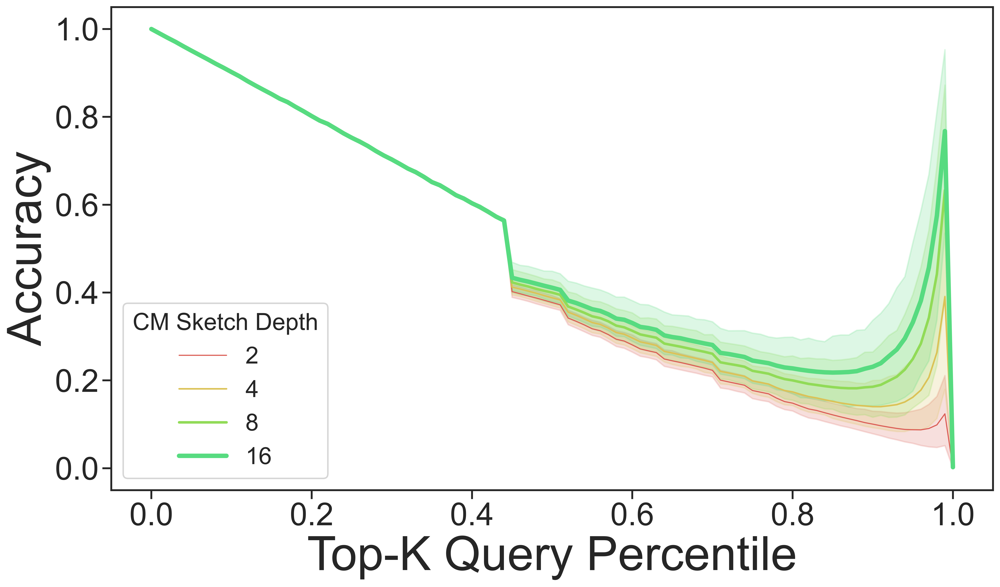

In [92]:
plt.figure(figsize=(16, 9), dpi=600)
ax = sns.lineplot(
    x="k_percentile",
    y="accuracy",
    size="cm_depth",
    hue="cm_depth",
    data=df_finite,
    legend="full",
    palette=color_palette
);
# ax.set_title(f'CM Sketch Query Percentile vs Accuracy', fontsize=32);
ax.set_ylabel("Accuracy", fontsize=48)
ax.set_xlabel("Top-K Query Percentile", fontsize=48)
ax.tick_params(axis='both', which='major', labelsize=32);
ax.legend(title="CM Sketch Depth", fontsize=24, title_fontsize=24);

C:\Users\rwita\AppData\Local\Temp/ipykernel_6332/417776024.py:13: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  ax = sns.lineplot(
C:\Users\rwita\AppData\Local\Temp/ipykernel_6332/417776024.py:13: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  ax = sns.lineplot(
C:\Users\rwita\AppData\Local\Temp/ipykernel_6332/417776024.py:13: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  ax = sns.lineplot(
C:\Users\rwita\AppData\Local\Temp/ipykernel_6332/417776024.py:13: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  ax = sns.lineplot(
C:\Users\rwita\AppData\Local\Temp/ipykernel_6332/417776024.py:13: UserWarning: The palette list has more values (8) than needed (4), which may not be intended.
  ax = sns.lineplot(


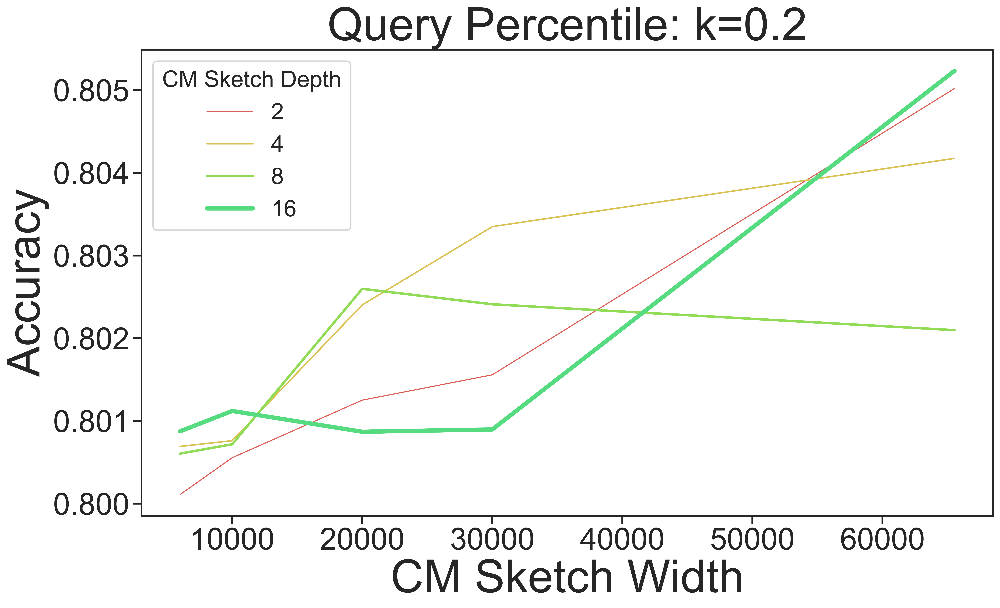

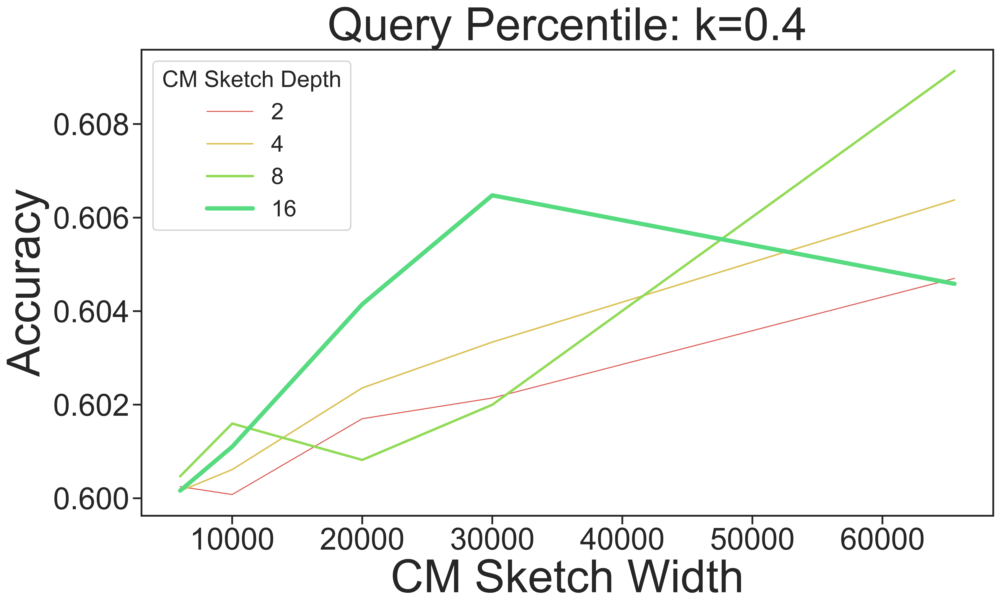

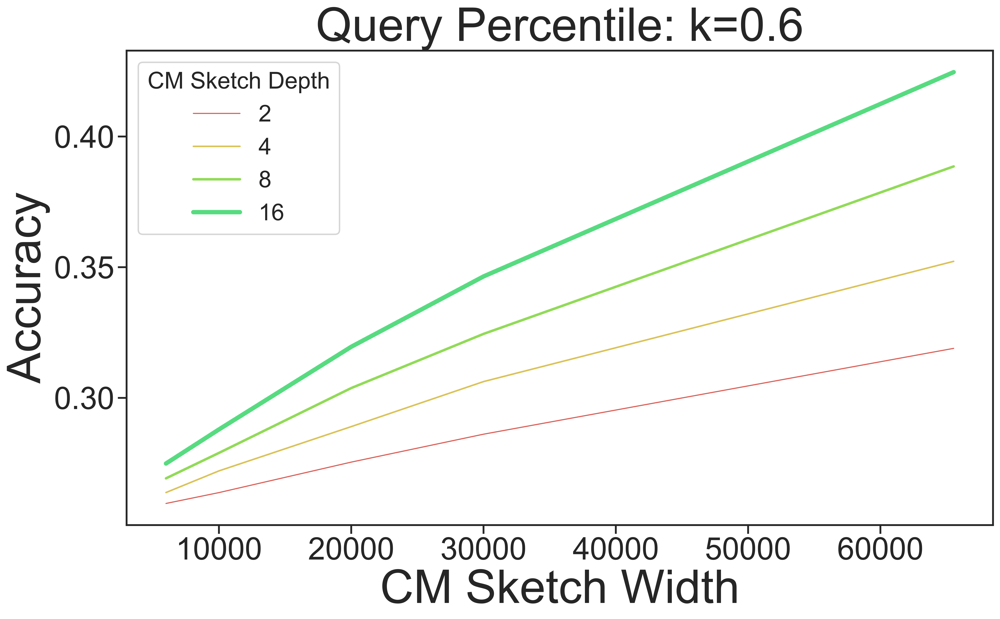

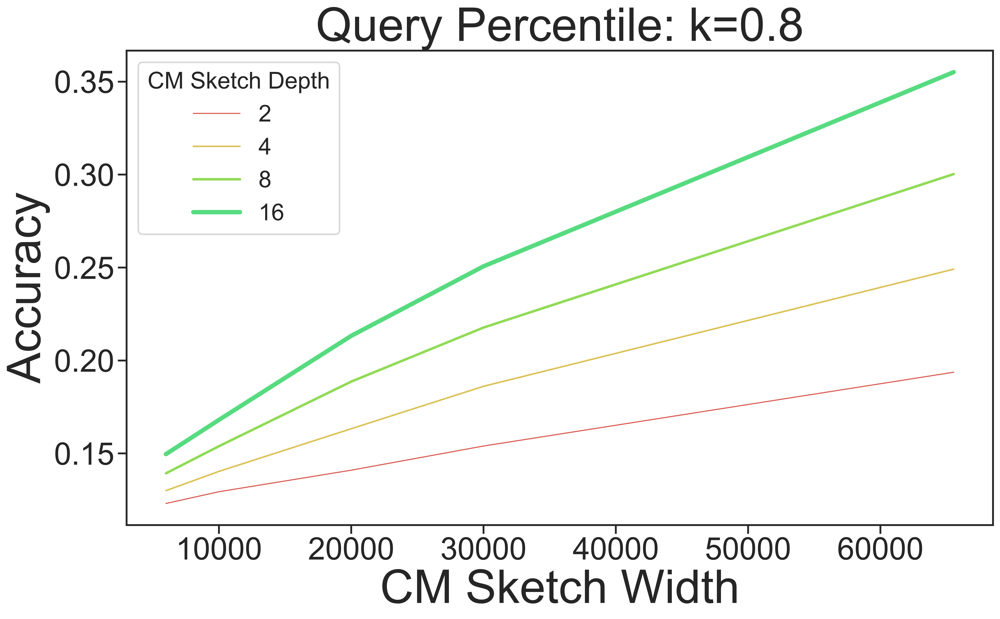

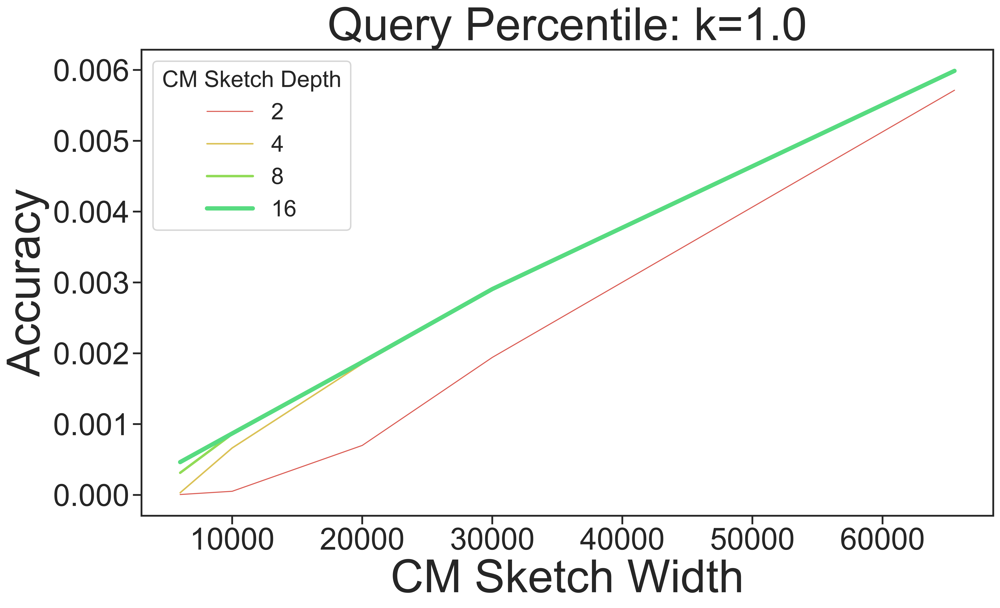

In [87]:
for percentile in [p/10 for p in range(2, 11, 2)]:
    plot_for_percentile(data=df_finite, percentile=percentile)

In [64]:
df_finite.loc[:, 'cm_memory'] = df_finite['cm_depth'].copy(deep=True) * df_finite['cm_width'].copy(deep=True)

### Trying to see combinations of (depth, width) for same memory footprints vs accuracy

In [65]:
memory_combinations = df_finite[df_finite['k_percentile'] == 0.2]['cm_memory'].value_counts()
memory_combinations = memory_combinations[memory_combinations > 2]

In [66]:
aspect_ratio_multiplier = 1

# pick a sigma and mu for normal distribution
sigma = 0.1
mu =0.05
# generate normally distributed samples

for memory_footprint, count in memory_combinations.items():    
    temp_df = df_finite[(df_finite['cm_memory'] == memory_footprint) & (df_finite['k_percentile'] == 0.6)].copy(deep=True)
    noise = sigma * np.random.randn(len(temp_df)) + mu
    plus_minus_mask = np.ones(len(noise))
    for elem in range(len(noise)):
        if bool(random.getrandbits(1)):
            plus_minus_mask[elem] = -1
    noise = plus_minus_mask * noise
    temp_df.loc[:, 'cm_depth'] = temp_df['cm_depth'] + 1.15*noise
    temp_df.loc[:, 'cm_width'] = temp_df['cm_width'] + 2500*noise

    plt.figure(figsize=(16*aspect_ratio_multiplier, 9*aspect_ratio_multiplier))
    ax = sns.scatterplot(
        x="cm_depth",
        y="cm_width",
        hue="accuracy",
        size="accuracy",
        sizes=(50, 500),
        linewidth=0,
        data=temp_df,
#         palette=["#d14a61"]
        palette=sns.color_palette("flare", as_cmap=True)
    )

    ax.set_title(f'CM Sketch Memory vs Accuracy\nMemory = {memory_footprint}', fontsize=16);
#     ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1);
    plt.setp(ax.get_legend().get_texts(), fontsize=16)
    plt.show()

### Overall memory footprints vs accuracy

C:\Users\rwita\AppData\Local\Temp/ipykernel_6332/1835789761.py:5: UserWarning: 
The palette list has fewer values (8) than needed (20) and will cycle, which may produce an uninterpretable plot.
  ax = sns.scatterplot(


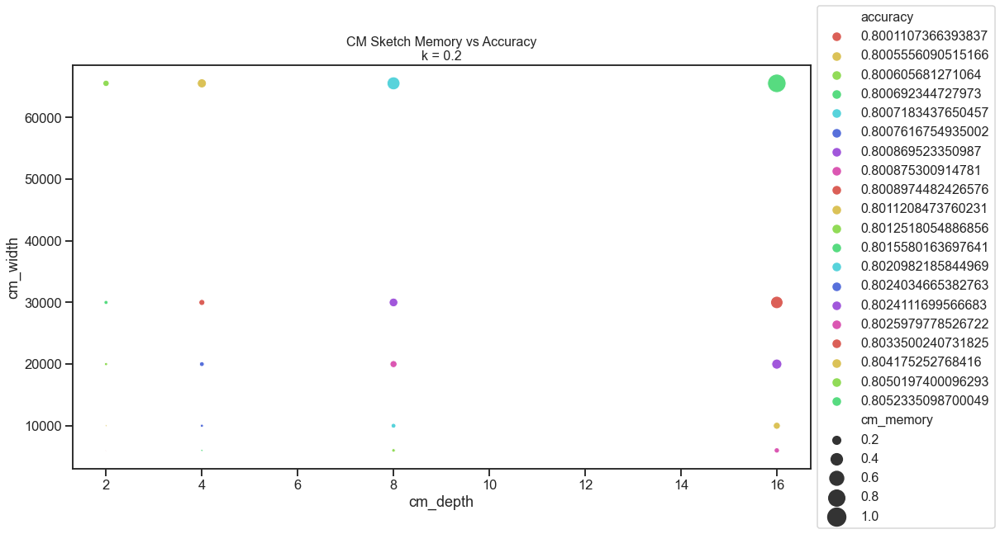

C:\Users\rwita\AppData\Local\Temp/ipykernel_6332/1835789761.py:5: UserWarning: 
The palette list has fewer values (8) than needed (20) and will cycle, which may produce an uninterpretable plot.
  ax = sns.scatterplot(


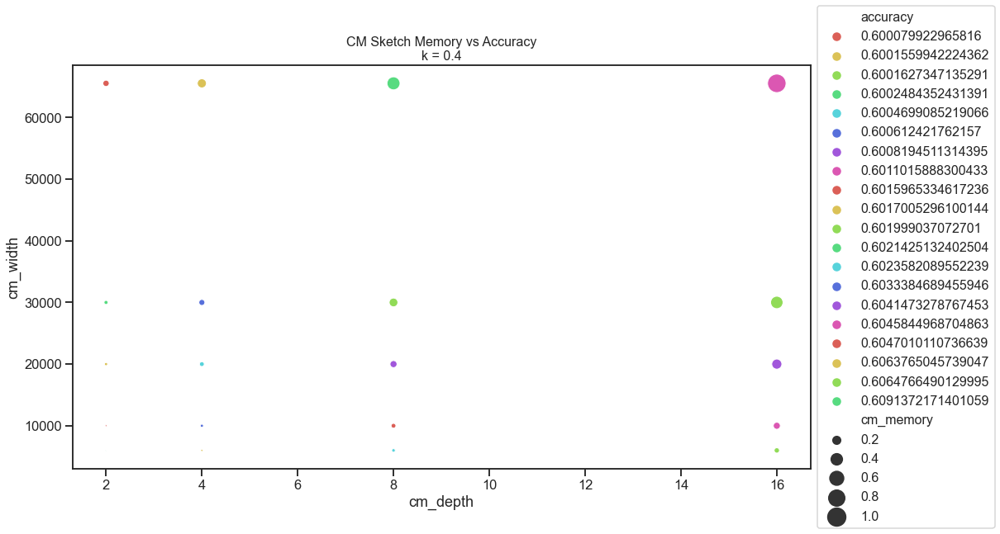

C:\Users\rwita\AppData\Local\Temp/ipykernel_6332/1835789761.py:5: UserWarning: 
The palette list has fewer values (8) than needed (20) and will cycle, which may produce an uninterpretable plot.
  ax = sns.scatterplot(


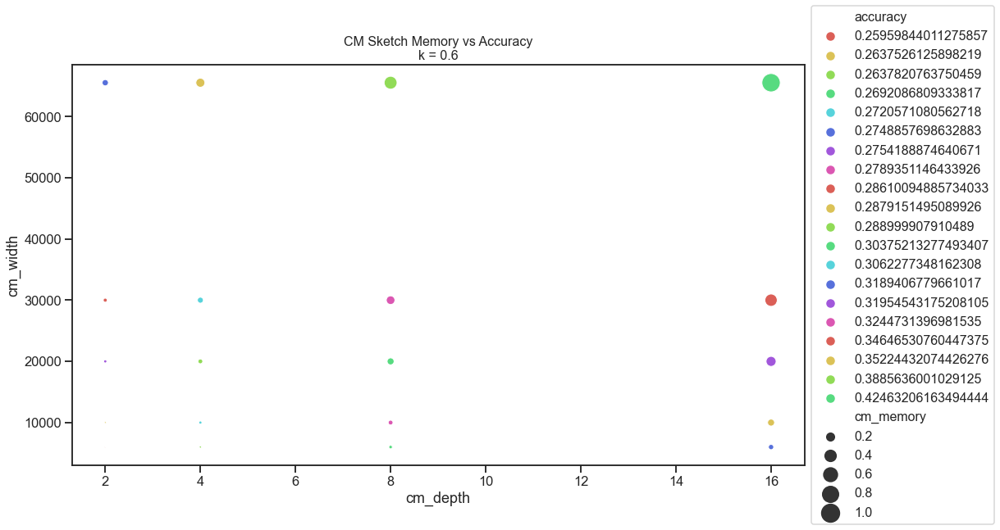

C:\Users\rwita\AppData\Local\Temp/ipykernel_6332/1835789761.py:5: UserWarning: 
The palette list has fewer values (8) than needed (20) and will cycle, which may produce an uninterpretable plot.
  ax = sns.scatterplot(


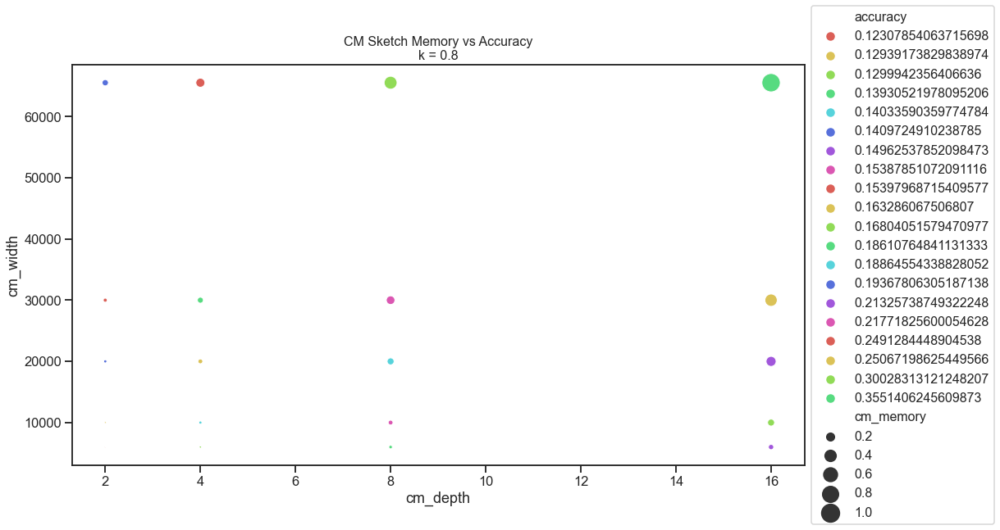

C:\Users\rwita\AppData\Local\Temp/ipykernel_6332/1835789761.py:5: UserWarning: 
The palette list has fewer values (8) than needed (18) and will cycle, which may produce an uninterpretable plot.
  ax = sns.scatterplot(


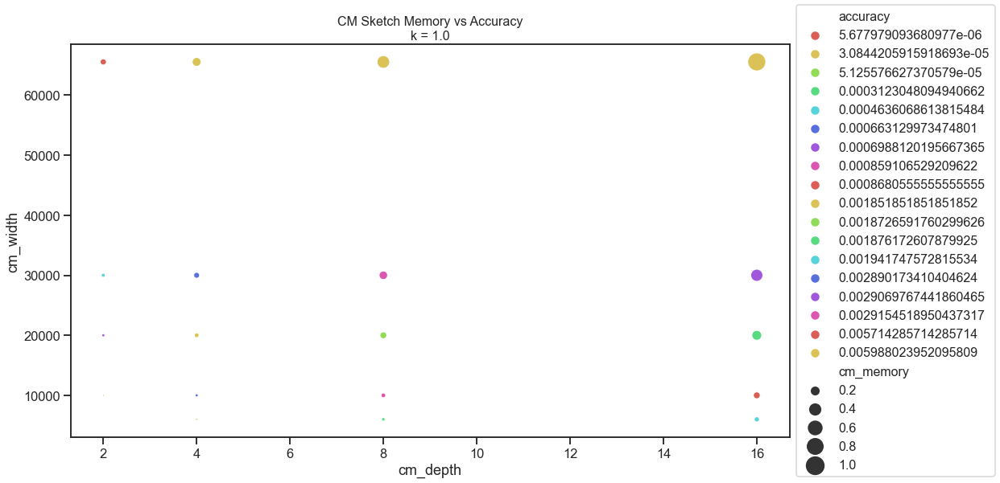

In [67]:
aspect_ratio_multiplier = 1

for percentile in [p/10 for p in range(2, 11, 2)]:
    plt.figure(figsize=(16*aspect_ratio_multiplier, 9*aspect_ratio_multiplier))
    ax = sns.scatterplot(
        x="cm_depth",
        y="cm_width",
        size="cm_memory",
        hue="accuracy",
        sizes=(1, 500),
        linewidth=1,
        data=df_finite[df_finite['k_percentile'] == percentile],
        palette=color_palette
    )

    ax.set_title(f'CM Sketch Memory vs Accuracy\nk = {percentile}', fontsize=16)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5), ncol=1)
    plt.setp(ax.get_legend().get_texts(), fontsize=16)
    plt.show()
#     break

In [68]:
actual_heavy_hitters = pd.read_pickle("./results/flow_packet_count.pkl").sort_values(by='Packet Count', ascending=False)
actual_heavy_hitters

,Flow ID,Packet Count
7905,240.10.73.217|240.10.68.10|80|52657|6,223592
774,240.10.96.25|240.10.82.12|443|51769|6,221114
12715,240.10.129.11|240.10.127.72|443|41678|6,135331
810,240.10.149.203|240.10.49.124|443|54005|6,130692
24,240.10.75.238|240.10.56.247|443|54733|6,128387
...,...,...
82993,240.10.55.159|240.10.97.97|27017|51520|6,1
82991,240.10.49.27|240.10.76.115|56771|15334|6,1
82990,240.10.73.76|240.10.63.250|1934|5105|6,1
82989,240.10.98.222|240.10.59.36|51357|177|6,1


In [69]:
cms_heavy_hitters = pd.read_pickle("./results/cms_heavy.pkl").sort_values(by='Packet Count', ascending=False)
cms_heavy_hitters

,Flow ID,Packet Count
0,240.10.85.4|240.10.53.73|443|55469|6,1616
119343,240.10.86.166|240.10.106.242|993|57125|6,1616
119381,240.10.57.157|240.10.69.243|46665|1065|6,1616
119382,240.10.99.121|240.10.61.88|40646|5555|6,1616
119386,240.10.99.65|240.10.92.39|60599|443|6,1616
...,...,...
74997,240.10.135.82|240.10.69.37|443|51338|6,483
25467,240.10.108.124|240.10.97.181|48344|34953|6,483
43084,240.10.89.38|240.10.98.96|80|52468|6,483
13737,240.10.105.103|240.10.145.147|51578|80|6,483


In [70]:
actual_quantile = actual_heavy_hitters.quantile(0.9)[0]
cms_quantile = cms_heavy_hitters.quantile(0.9)[0]

heavy_actual_flows = set(actual_heavy_hitters.loc[actual_heavy_hitters['Packet Count'] >= actual_quantile]['Flow ID'])
heavy_cms_flows = set(cms_heavy_hitters.loc[cms_heavy_hitters['Packet Count'] >= cms_quantile]['Flow ID'])